Breast Ultrasound Images Dataset

IMPORT DEPENDENCIES

In [58]:
import numpy as np 
import pandas as pd 
import os 
import matplotlib.pyplot as plt 
import tensorflow as tf 
from PIL import Image
from glob import glob
import os

from tensorflow.keras.preprocessing.image import ImageDataGenerator
from sklearn.model_selection import train_test_split
from tensorflow import keras
from tensorflow.keras.layers import Dense
from tensorflow.keras.preprocessing.image import ImageDataGenerator
from tensorflow.keras import backend as K
from tensorflow.keras import layers
from tensorflow.keras import models
from PIL import Image
import cv2

CREATE TRAINING AND TESTING DATA

In [59]:
def create_data(data_dir, categories):
    images = []
    masks = []
    labels = []

    for i, category in enumerate(categories):
        category_dir = os.path.join(data_dir, category)
        for file_name in os.listdir(category_dir):
            if "_mask" in file_name:
                continue
            image_file_path = os.path.join(category_dir, file_name)
            mask_file_name = file_name.replace(".", "_mask.")
            mask_file_path = os.path.join(category_dir, mask_file_name)
            if not os.path.exists(mask_file_path):
                continue
            images.append(image_file_path)
            masks.append(mask_file_path)
            labels.append(category)

    print(f"Found {len(images)} image/mask pairs in {len(categories)} categories")
    return images, masks, labels


In [60]:
data_dir ="/kaggle/input/breast-ultrasound-images-dataset/Dataset_BUSI_with_GT"

categories = ['benign','malignant','normal']

images,masks,labels=create_data(data_dir,categories)


Found 780 image/mask pairs in 3 categories


In [61]:
df = pd.DataFrame({'image':images,'mask':masks,'label':labels})


In [62]:
df.head()

,image,mask,label
0,/kaggle/input/breast-ultrasound-images-dataset...,/kaggle/input/breast-ultrasound-images-dataset...,benign
1,/kaggle/input/breast-ultrasound-images-dataset...,/kaggle/input/breast-ultrasound-images-dataset...,benign
2,/kaggle/input/breast-ultrasound-images-dataset...,/kaggle/input/breast-ultrasound-images-dataset...,benign
3,/kaggle/input/breast-ultrasound-images-dataset...,/kaggle/input/breast-ultrasound-images-dataset...,benign
4,/kaggle/input/breast-ultrasound-images-dataset...,/kaggle/input/breast-ultrasound-images-dataset...,benign


In [63]:
df.shape

(780, 3)

In [64]:
df_train,df_test=train_test_split(df,test_size=0.1)

In [65]:
df_benign=df_train[df_train['label']=='benign']
df_malignant=df_train[df_train['label']=='malignant']
df_normal=df_train[df_train['label']=='normal']

DATA VISUALISATION

In [66]:
df_benign.head()

,image,mask,label
101,/kaggle/input/breast-ultrasound-images-dataset...,/kaggle/input/breast-ultrasound-images-dataset...,benign
363,/kaggle/input/breast-ultrasound-images-dataset...,/kaggle/input/breast-ultrasound-images-dataset...,benign
358,/kaggle/input/breast-ultrasound-images-dataset...,/kaggle/input/breast-ultrasound-images-dataset...,benign
140,/kaggle/input/breast-ultrasound-images-dataset...,/kaggle/input/breast-ultrasound-images-dataset...,benign
303,/kaggle/input/breast-ultrasound-images-dataset...,/kaggle/input/breast-ultrasound-images-dataset...,benign


In [67]:
df_malignant.head()

,image,mask,label
630,/kaggle/input/breast-ultrasound-images-dataset...,/kaggle/input/breast-ultrasound-images-dataset...,malignant
490,/kaggle/input/breast-ultrasound-images-dataset...,/kaggle/input/breast-ultrasound-images-dataset...,malignant
552,/kaggle/input/breast-ultrasound-images-dataset...,/kaggle/input/breast-ultrasound-images-dataset...,malignant
634,/kaggle/input/breast-ultrasound-images-dataset...,/kaggle/input/breast-ultrasound-images-dataset...,malignant
532,/kaggle/input/breast-ultrasound-images-dataset...,/kaggle/input/breast-ultrasound-images-dataset...,malignant


In [68]:
df_normal.head()

,image,mask,label
651,/kaggle/input/breast-ultrasound-images-dataset...,/kaggle/input/breast-ultrasound-images-dataset...,normal
767,/kaggle/input/breast-ultrasound-images-dataset...,/kaggle/input/breast-ultrasound-images-dataset...,normal
773,/kaggle/input/breast-ultrasound-images-dataset...,/kaggle/input/breast-ultrasound-images-dataset...,normal
772,/kaggle/input/breast-ultrasound-images-dataset...,/kaggle/input/breast-ultrasound-images-dataset...,normal
700,/kaggle/input/breast-ultrasound-images-dataset...,/kaggle/input/breast-ultrasound-images-dataset...,normal


In [69]:
print(df_benign.shape)
print(df_malignant.shape)
print(df_normal.shape)

(392, 3)
(190, 3)
(120, 3)


In [70]:
def plot_data(data,index):
  row = data.iloc[index]
  img = cv2.imread(row['image'])
  msk = cv2.imread(row['mask'])
  label = row['label']


  fig, axs = plt.subplots(1, 3, figsize=(15, 5))
  axs[0].imshow(img)
  axs[0].set_title('Image')
  axs[1].imshow(msk)
  axs[1].set_title('Mask')
  axs[2].text(0.5, 0.5, f'Label: {label}', ha='center', va='center', fontsize=16)
  axs[2].axis('off')
  plt.show()


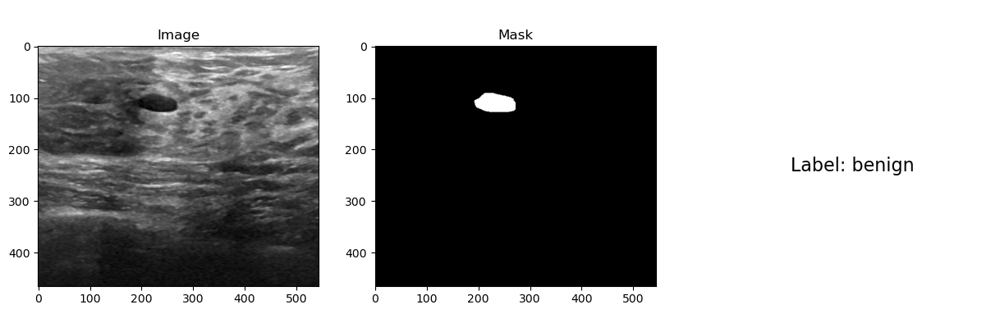

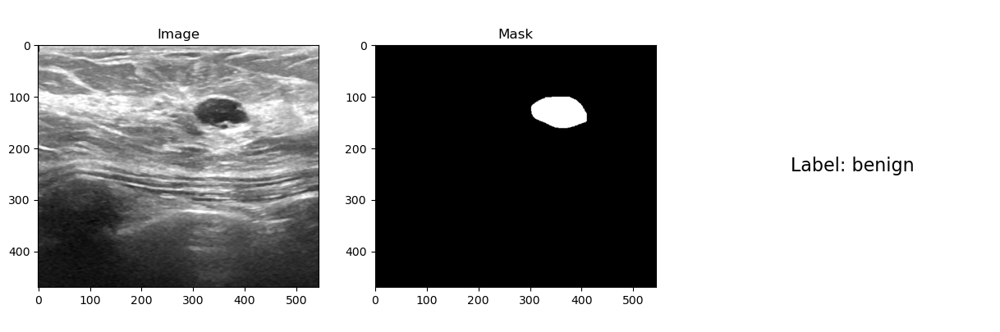

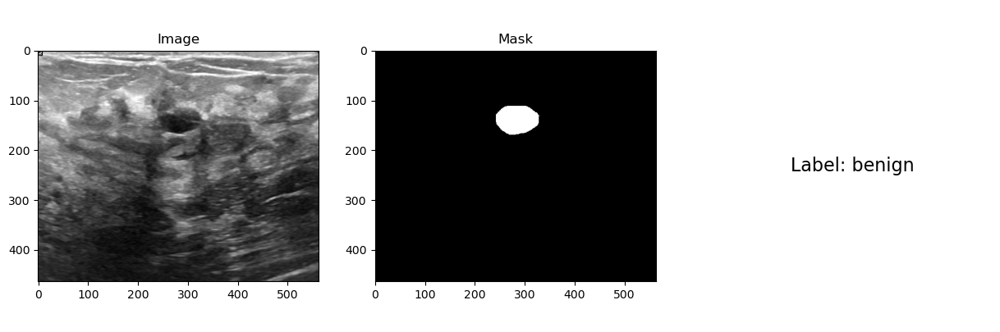

In [71]:
for i in range(3):
 plot_data(df_benign,i)

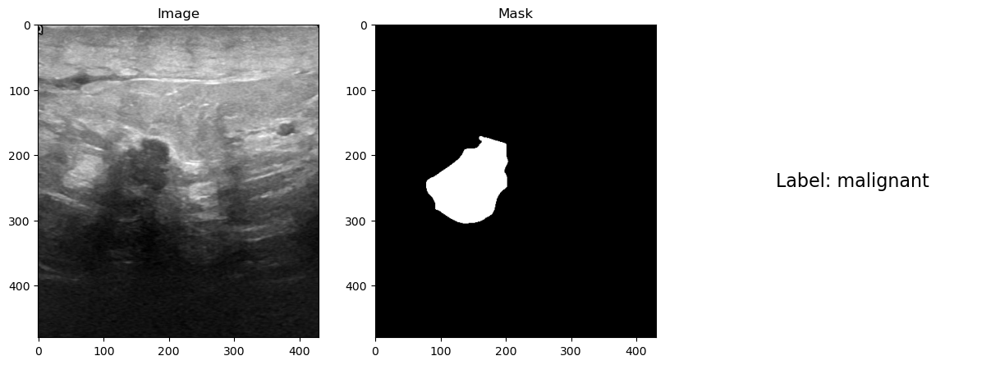

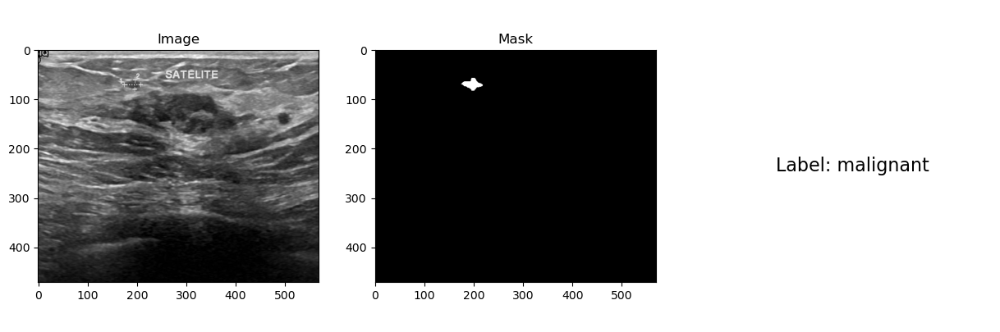

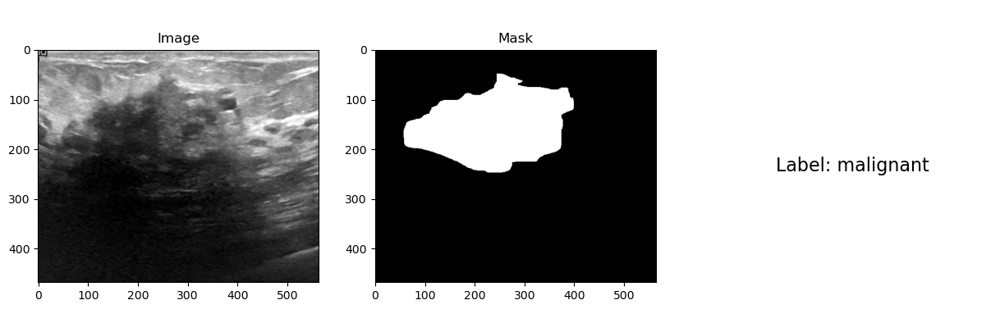

In [72]:
for i in range(3):
    plot_data(df_malignant,i)

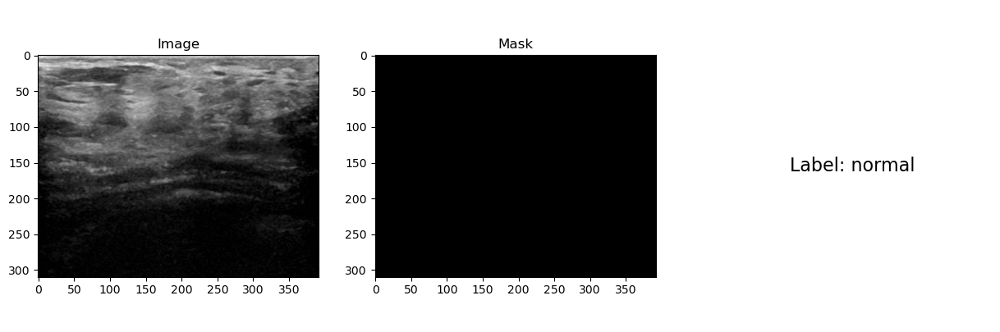

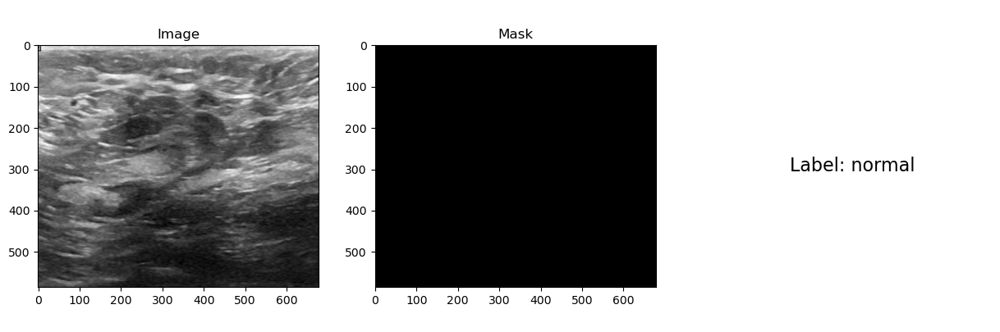

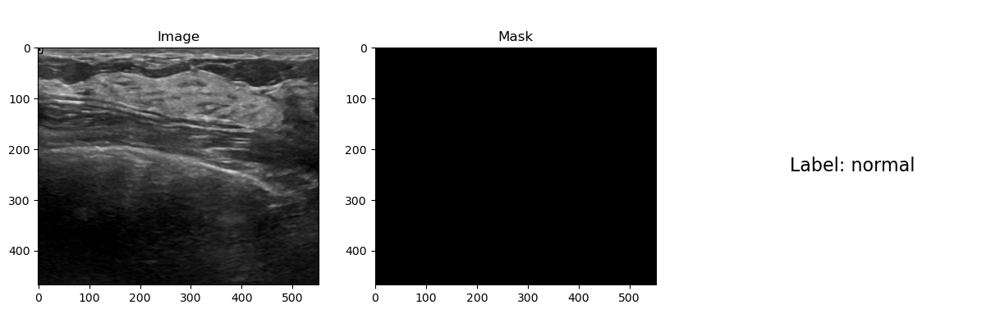

In [73]:
for i in range(3):
    plot_data(df_normal,i)

DATA AUGMENTATION

In [74]:
def train_val_gen(df):
    
    
    
    data_train,data_val=train_test_split(df,test_size=0.2)
    
    datagen = ImageDataGenerator(rotation_range=45,
                            width_shift_range=0.2,
                            height_shift_range=0.2,
                            shear_range=0.2,
                            zoom_range=0.2,
                            horizontal_flip=True,
                            fill_mode='reflect',
                            rescale=1./255)
    

    image_train=datagen.flow_from_dataframe(data_train,  
                                    target_size=(256,256), 
                                    color_mode='rgb',
                                    shuffle=True,
                                    seed=42,
                                    x_col ="image", 
                                    batch_size=32,
                                    class_mode=None)
                                    

    mask_train=datagen.flow_from_dataframe(data_train, 
                                    target_size=(256,256), 
                                    color_mode='grayscale',
                                    shuffle=True,
                                    seed=42,
                                    x_col ="mask", 
                                    batch_size=32,
                                    class_mode=None)

    image_validation=datagen.flow_from_dataframe(data_val,  
                                    target_size=(256,256), 
                                    color_mode='rgb',
                                    shuffle=True,
                                    seed=42,
                                    x_col ="image", 
                                    batch_size=32,
                                    class_mode=None)


    mask_validation=datagen.flow_from_dataframe(data_val, 
                                    target_size=(256,256), 
                                    color_mode='grayscale',
                                    shuffle=True,
                                    seed=42,
                                    x_col ="mask", 
                                    batch_size=32,
                                    class_mode=None)

    train_gen=(image_train,mask_train)
    valid_gen=(image_validation,mask_validation)

    return train_gen,valid_gen

    
    

In [75]:
train_gen_benign,valid_gen_benign=train_val_gen(df_benign)


Found 313 validated image filenames.
Found 313 validated image filenames.
Found 79 validated image filenames.
Found 79 validated image filenames.


In [76]:
train_gen_malignant,valid_gen_malignant=train_val_gen(df_malignant)

Found 152 validated image filenames.
Found 152 validated image filenames.
Found 38 validated image filenames.
Found 38 validated image filenames.


In [77]:
train_gen_normal,valid_gen_normal=train_val_gen(df_normal)

Found 96 validated image filenames.
Found 96 validated image filenames.
Found 24 validated image filenames.
Found 24 validated image filenames.


In [78]:
import itertools

In [79]:
train_gen1 = zip(train_gen_benign[0], train_gen_benign[1])
train_gen2 = zip(train_gen_malignant[0], train_gen_malignant[1])
train_gen3 = zip(train_gen_normal[0], train_gen_normal[1])

valid_gen1 = zip(valid_gen_benign[0], valid_gen_benign[1])
valid_gen2 = zip(valid_gen_malignant[0], valid_gen_malignant[1])
valid_gen3 = zip(valid_gen_normal[0], valid_gen_normal[1])


train_gen = itertools.chain(train_gen1, train_gen2,train_gen3)
valid_gen = itertools.chain(valid_gen1, valid_gen2,valid_gen3)

MODELING

In [80]:
def unet(input_size=(256,256,3)):
    inputs = layers.Input(input_size)
    
    conv1 = layers.Conv2D(64, (3, 3), padding='same')(inputs)
    bn1 = layers.Activation('relu')(conv1)
    conv1 = layers.Conv2D(64, (3, 3), padding='same')(bn1)
    bn1 = layers.BatchNormalization(axis=3)(conv1)
    bn1 = layers.Activation('relu')(bn1)
    pool1 = layers.MaxPooling2D(pool_size=(2, 2))(bn1)

    conv2 = layers.Conv2D(128, (3, 3), padding='same')(pool1)
    bn2 = layers.Activation('relu')(conv2)
    conv2 = layers.Conv2D(128, (3, 3), padding='same')(bn2)
    bn2 = layers.BatchNormalization(axis=3)(conv2)
    bn2 = layers.Activation('relu')(bn2)
    pool2 = layers.MaxPooling2D(pool_size=(2, 2))(bn2)

    conv3 = layers.Conv2D(256, (3, 3), padding='same')(pool2)
    bn3 = layers.Activation('relu')(conv3)
    conv3 = layers.Conv2D(256, (3, 3), padding='same')(bn3)
    bn3 = layers.BatchNormalization(axis=3)(conv3)
    bn3 = layers.Activation('relu')(bn3)
    pool3 = layers.MaxPooling2D(pool_size=(2, 2))(bn3)

    conv4 = layers.Conv2D(512, (3, 3), padding='same')(pool3)
    bn4 = layers.Activation('relu')(conv4)
    conv4 = layers.Conv2D(512, (3, 3), padding='same')(bn4)
    bn4 = layers.BatchNormalization(axis=3)(conv4)
    bn4 = layers.Activation('relu')(bn4)
    pool4 = layers.MaxPooling2D(pool_size=(2, 2))(bn4)

    conv5 = layers.Conv2D(1024, (3, 3), padding='same')(pool4)
    bn5 = layers.Activation('relu')(conv5)
    conv5 = layers.Conv2D(1024, (3, 3), padding='same')(bn5)
    bn5 = layers.BatchNormalization(axis=3)(conv5)
    bn5 = layers.Activation('relu')(bn5)

    up6 = layers.concatenate([layers.Conv2DTranspose(512, (2, 2), strides=(2, 2), padding='same')(bn5), conv4], axis=3)
    conv6 = layers.Conv2D(512, (3, 3), padding='same')(up6)
    bn6 = layers.Activation('relu')(conv6)
    conv6 = layers.Conv2D(512, (3, 3), padding='same')(bn6)
    bn6 = layers.BatchNormalization(axis=3)(conv6)
    bn6 = layers.Activation('relu')(bn6)

    up7 = layers.concatenate([layers.Conv2DTranspose(256, (2, 2), strides=(2, 2), padding='same')(bn6), conv3], axis=3)
    conv7 = layers.Conv2D(256, (3, 3), padding='same')(up7)
    bn7 = layers.Activation('relu')(conv7)
    conv7 = layers.Conv2D(256, (3, 3), padding='same')(bn7)
    bn7 = layers.BatchNormalization(axis=3)(conv7)
    bn7 = layers.Activation('relu')(bn7)

    up8 = layers.concatenate([layers.Conv2DTranspose(128, (2, 2), strides=(2, 2), padding='same')(bn7), conv2], axis=3)
    conv8 = layers.Conv2D(128, (3, 3), padding='same')(up8)
    bn8 = layers.Activation('relu')(conv8)
    conv8 = layers.Conv2D(128, (3, 3), padding='same')(bn8)
    bn8 = layers.BatchNormalization(axis=3)(conv8)
    bn8 = layers.Activation('relu')(bn8)

    up9 = layers.concatenate([layers.Conv2DTranspose(64, (2, 2), strides=(2, 2), padding='same')(bn8), conv1], axis=3)
    conv9 = layers.Conv2D(64, (3, 3), padding='same')(up9)
    bn9 = layers.Activation('relu')(conv9)
    conv9 = layers.Conv2D(64, (3, 3), padding='same')(bn9)
    bn9 = layers.BatchNormalization(axis=3)(conv9)
    bn9 = layers.Activation('relu')(bn9)

    conv10 = layers.Conv2D(1, (1, 1), activation='sigmoid')(bn9)

    return models.Model(inputs=[inputs], outputs=[conv10])

This is the implementation of the Dice coefficient for use in training a deep learning model. The dice_coef function calculates the Dice coefficient between the predicted and true labels for a given batch of data.

In this implementation, smooth is a constant value used to prevent division by zero in case the denominator in the Dice coefficient formula is zero. This is a common technique used to ensure numerical stability in deep learning models.

The dice_coef_loss function calculates the loss function for the Dice coefficient, which is the complement of the Dice coefficient. This loss function can be used to train a deep learning model to optimize the Dice coefficient.

The bce_dice_loss function combines the binary cross-entropy loss and the Dice coefficient loss to create a single loss function that can be used to train a deep learning model. This combined loss function can help balance the tradeoff between accuracy and generalization of the model.

Overall, this implementation is designed to train a deep learning model to optimize the Dice coefficient for a given task, such as image segmentation or object detection.

In [81]:
smooth=1
def dice_coef(y_true, y_pred):
    y_true = K.flatten(y_true)
    y_pred = K.flatten(y_pred)
    intersection = K.sum(y_true * y_pred)
    union = K.sum(y_true) + K.sum(y_pred)
    return (2.0 * intersection + smooth) / (union + smooth)

def dice_coef_loss(y_true, y_pred):
    return 1 - dice_coef(y_true, y_pred)

def bce_dice_loss(y_true, y_pred):
    bce = tf.keras.losses.BinaryCrossentropy(from_logits=True)
    return dice_coef_loss(y_true, y_pred) + bce(y_true, y_pred)

In [82]:
model = unet(input_size=(256, 256, 3))

In [83]:
model.summary()

Model: "model_2"
__________________________________________________________________________________________________
 Layer (type)                   Output Shape         Param #     Connected to                     
 input_3 (InputLayer)           [(None, 256, 256, 3  0           []                               
                                )]                                                                
                                                                                                  
 conv2d_38 (Conv2D)             (None, 256, 256, 64  1792        ['input_3[0][0]']                
                                )                                                                 
                                                                                                  
 activation_36 (Activation)     (None, 256, 256, 64  0           ['conv2d_38[0][0]']              
                                )                                                           

FITTING THE MODEL

In [84]:
model.compile(
    optimizer='adam',
    loss=bce_dice_loss,
    metrics=[dice_coef,'accuracy'])

In [85]:
history = model.fit_generator(
    train_gen,
    validation_data=valid_gen,
    epochs=30,
    validation_steps=32,
    steps_per_epoch=100
)

/opt/conda/lib/python3.7/site-packages/ipykernel_launcher.py:6: UserWarning: `Model.fit_generator` is deprecated and will be removed in a future version. Please use `Model.fit`, which supports generators.
  


Epoch 1/30


/opt/conda/lib/python3.7/site-packages/keras/backend.py:5677: UserWarning: "`binary_crossentropy` received `from_logits=True`, but the `output` argument was produced by a Sigmoid activation and thus does not represent logits. Was this intended?
  output, from_logits, "Sigmoid", "binary_crossentropy"


100/100 [==============================] - 166s 2s/step - loss: 0.9748 - dice_coef: 0.2928 - accuracy: 0.9117 - val_loss: 1.1981 - val_dice_coef: 0.1723 - val_accuracy: 0.8410
Epoch 2/30
100/100 [==============================] - 158s 2s/step - loss: 0.7455 - dice_coef: 0.4556 - accuracy: 0.9384 - val_loss: 1.2674 - val_dice_coef: 0.0634 - val_accuracy: 0.9277
Epoch 3/30
100/100 [==============================] - 149s 1s/step - loss: 0.6416 - dice_coef: 0.5457 - accuracy: 0.9465 - val_loss: 1.1093 - val_dice_coef: 0.2399 - val_accuracy: 0.9354
Epoch 4/30
100/100 [==============================] - 143s 1s/step - loss: 0.5920 - dice_coef: 0.5870 - accuracy: 0.9504 - val_loss: 1.2113 - val_dice_coef: 0.1947 - val_accuracy: 0.9332
Epoch 5/30
100/100 [==============================] - 155s 2s/step - loss: 0.5483 - dice_coef: 0.6191 - accuracy: 0.9542 - val_loss: 0.7652 - val_dice_coef: 0.4959 - val_accuracy: 0.9491
Epoch 6/30
100/100 [==============================] - 141s 1s/step - loss: 0

In [88]:
eval_results = model.evaluate(valid_gen, steps=32, verbose=1)

32/32 [==============================] - 27s 872ms/step - loss: 0.4905 - dice_coef: 0.7054 - accuracy: 0.9605


TESTING

1/1 [==============================] - 0s 28ms/step


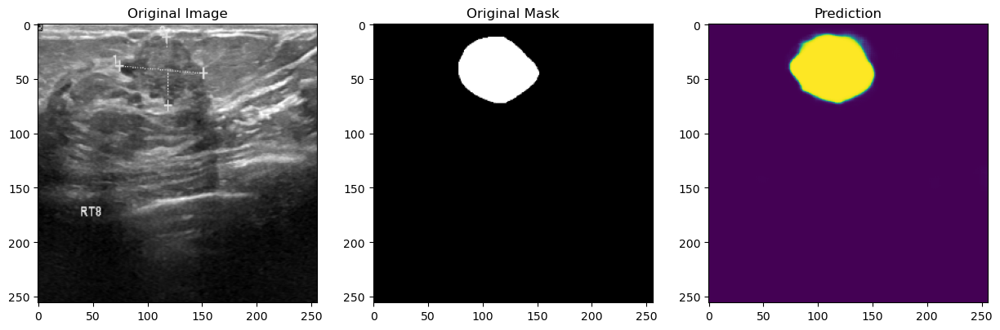

1/1 [==============================] - 0s 28ms/step


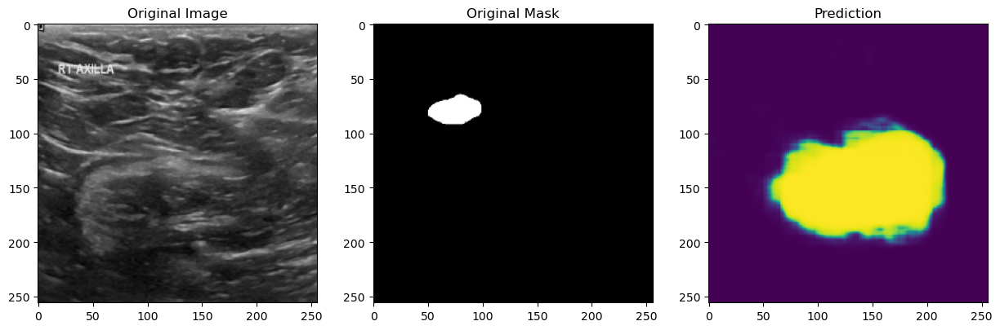

1/1 [==============================] - 0s 26ms/step


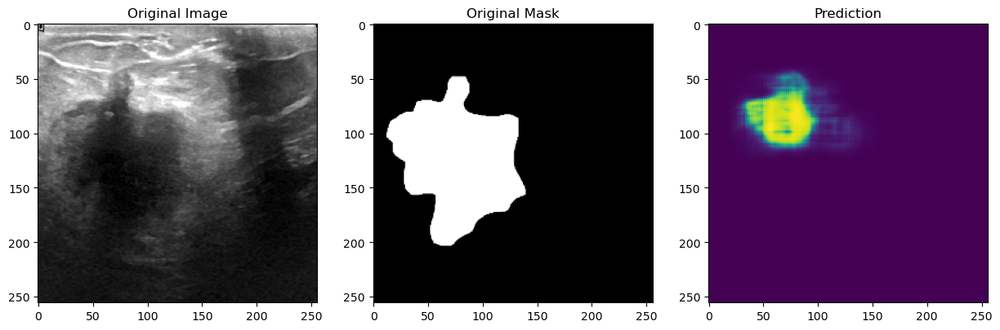

1/1 [==============================] - 0s 27ms/step


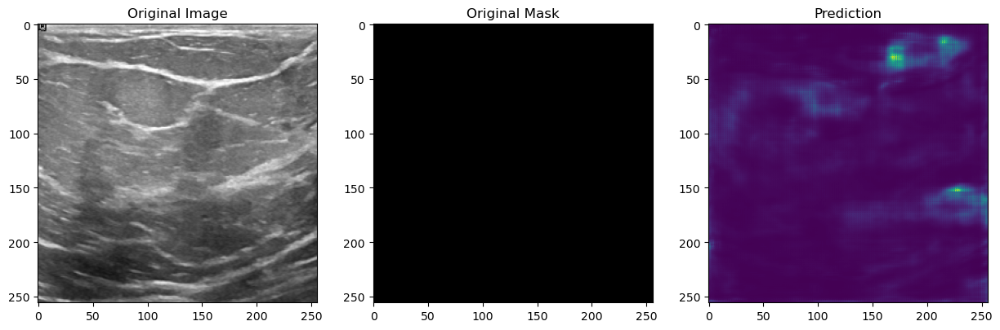

1/1 [==============================] - 0s 25ms/step


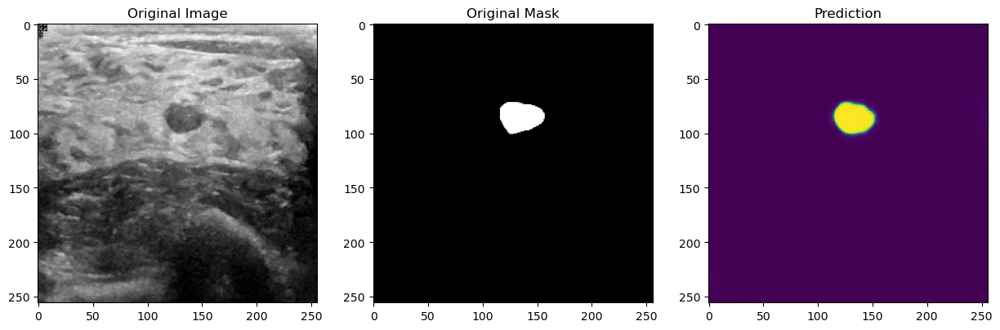

1/1 [==============================] - 0s 30ms/step


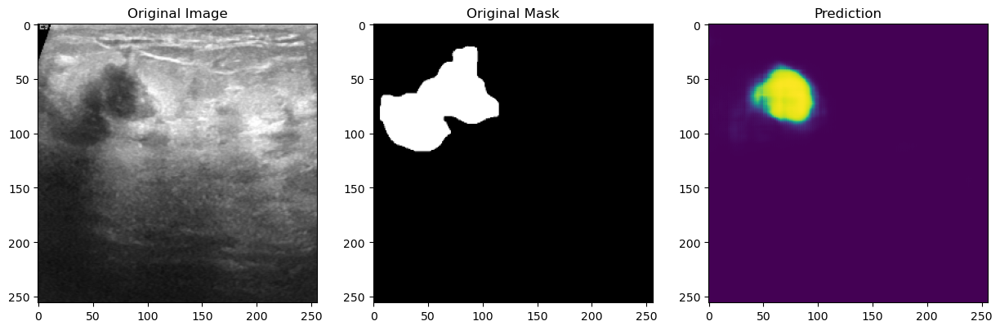

1/1 [==============================] - 0s 24ms/step


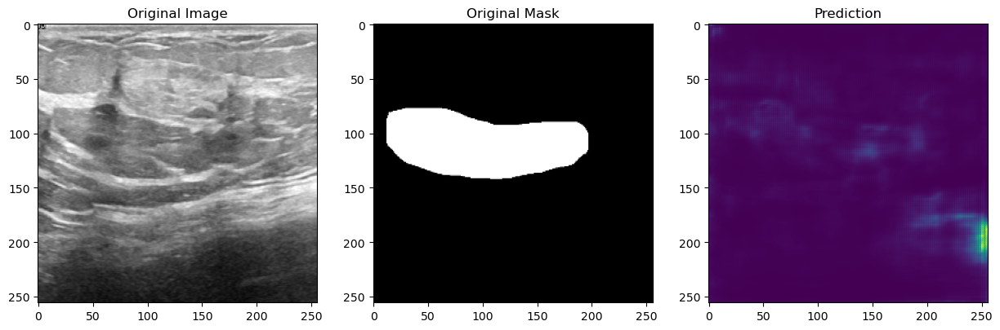

1/1 [==============================] - 0s 26ms/step


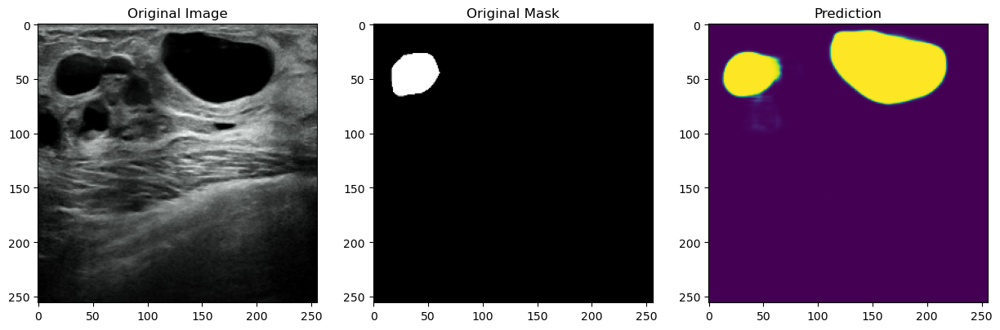

1/1 [==============================] - 0s 28ms/step


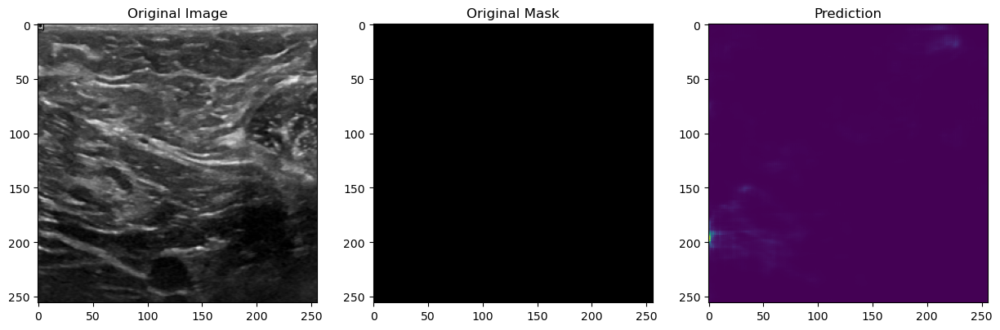

1/1 [==============================] - 0s 31ms/step


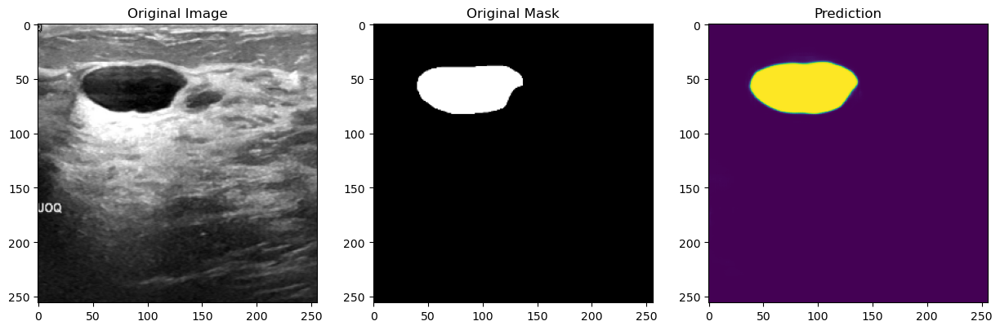

1/1 [==============================] - 0s 27ms/step


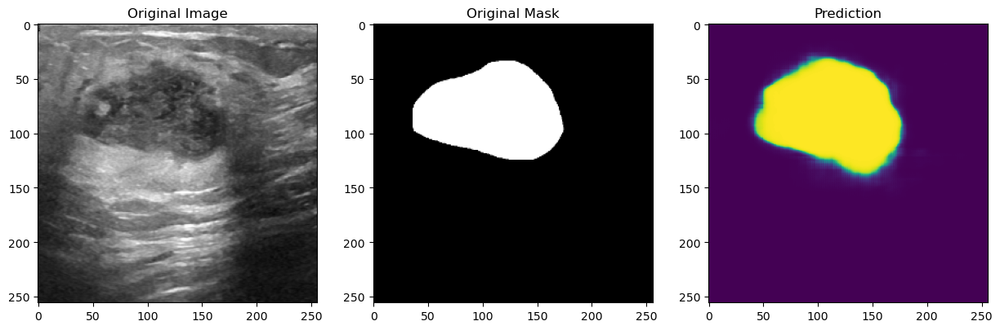

1/1 [==============================] - 0s 29ms/step


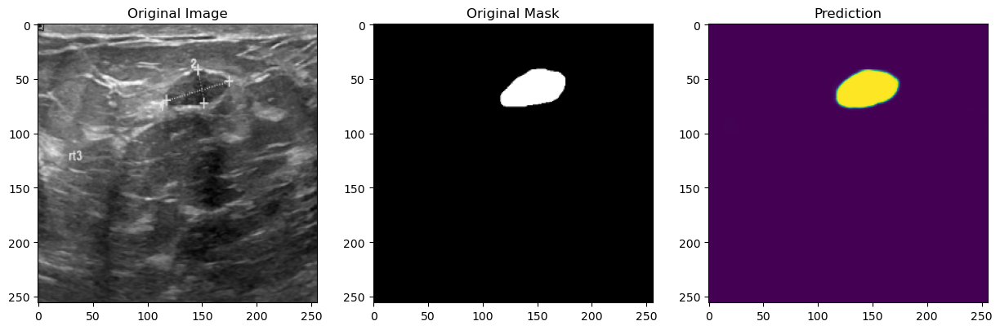

1/1 [==============================] - 0s 28ms/step


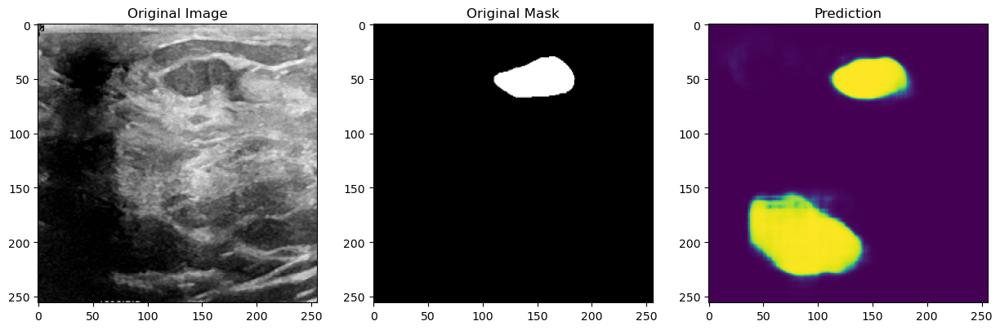

1/1 [==============================] - 0s 29ms/step


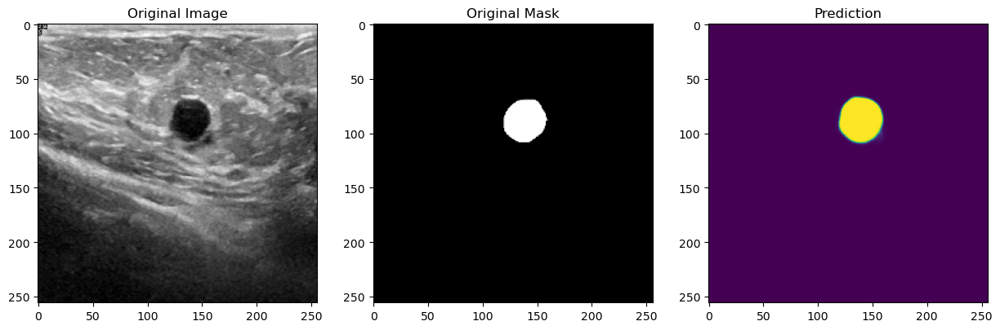

1/1 [==============================] - 0s 28ms/step


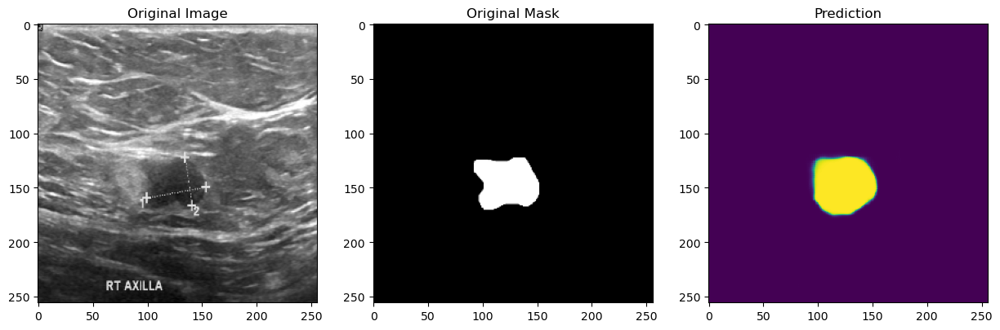

1/1 [==============================] - 0s 28ms/step


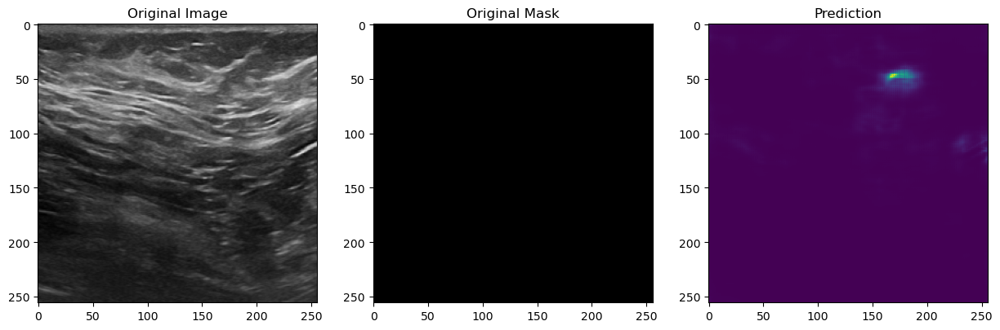

1/1 [==============================] - 0s 27ms/step


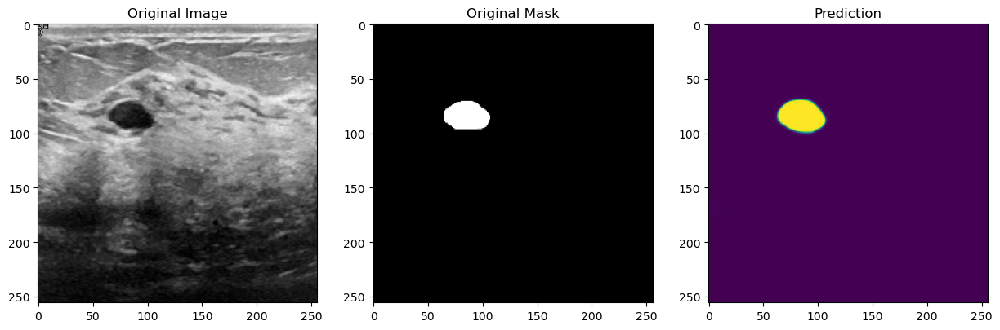

1/1 [==============================] - 0s 27ms/step


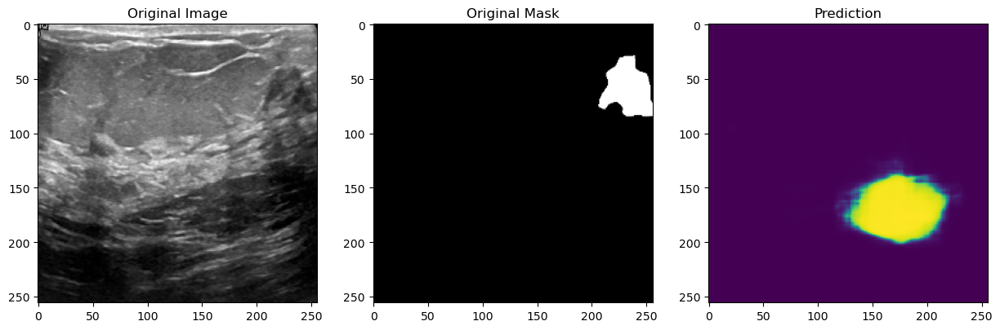

1/1 [==============================] - 0s 27ms/step


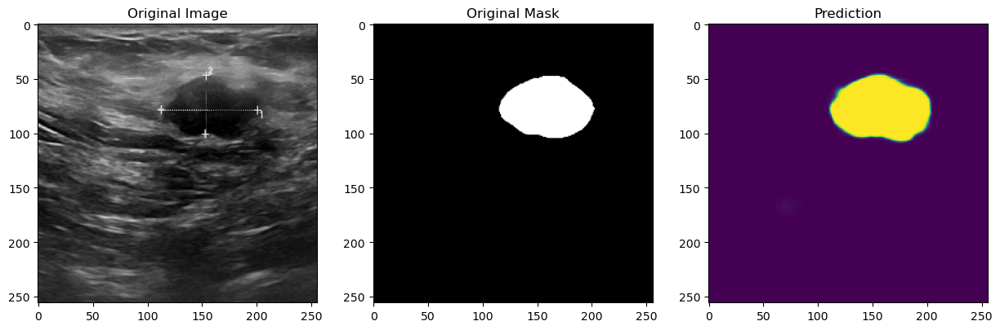

1/1 [==============================] - 0s 27ms/step


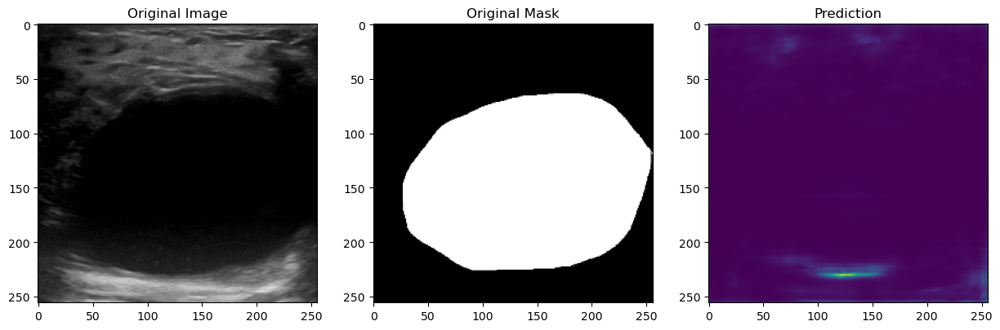

1/1 [==============================] - 0s 26ms/step


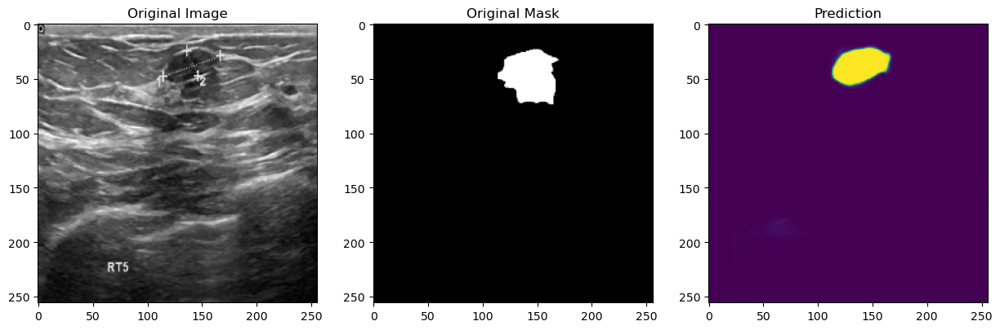

1/1 [==============================] - 0s 24ms/step


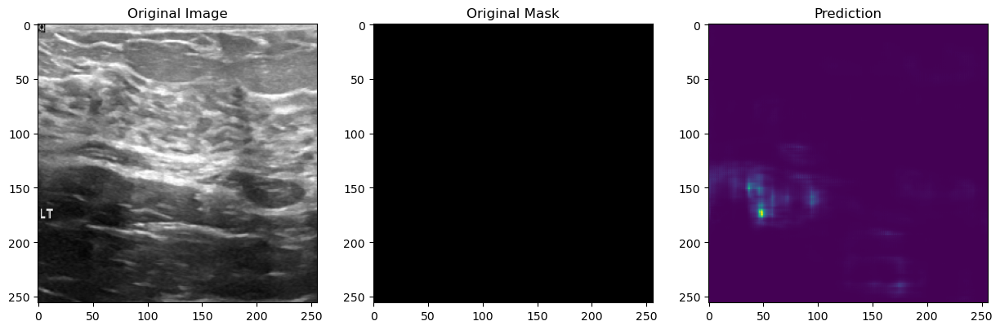

1/1 [==============================] - 0s 38ms/step


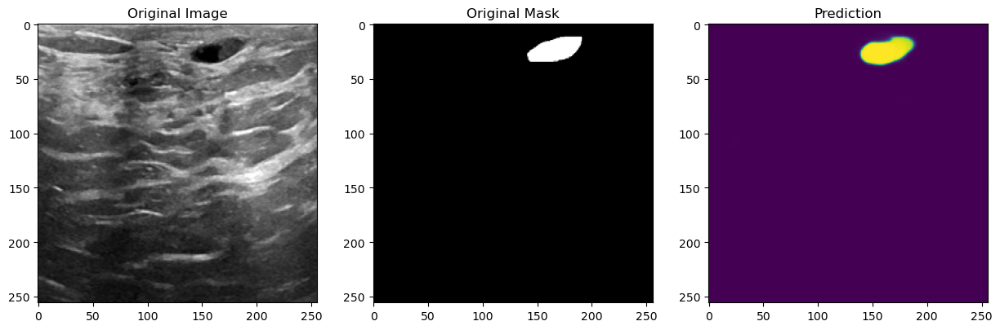

1/1 [==============================] - 0s 33ms/step


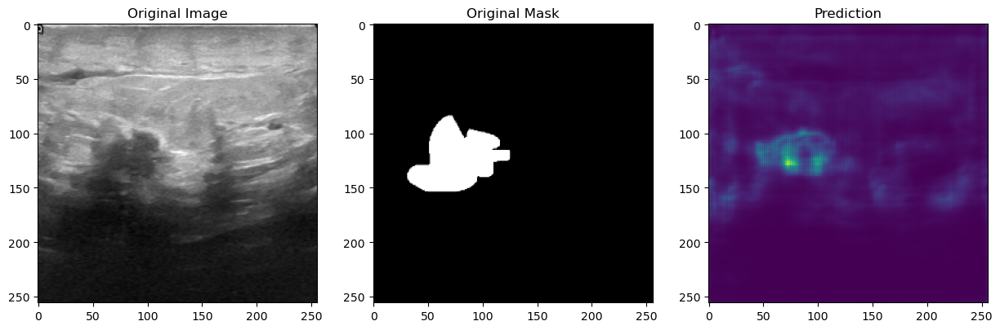

1/1 [==============================] - 0s 26ms/step


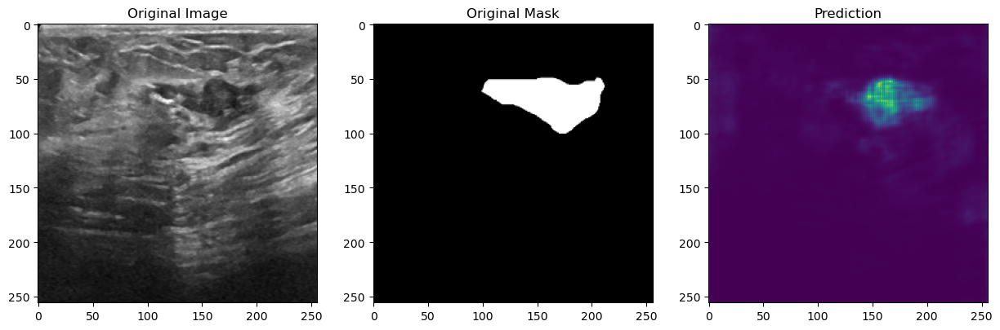

1/1 [==============================] - 0s 31ms/step


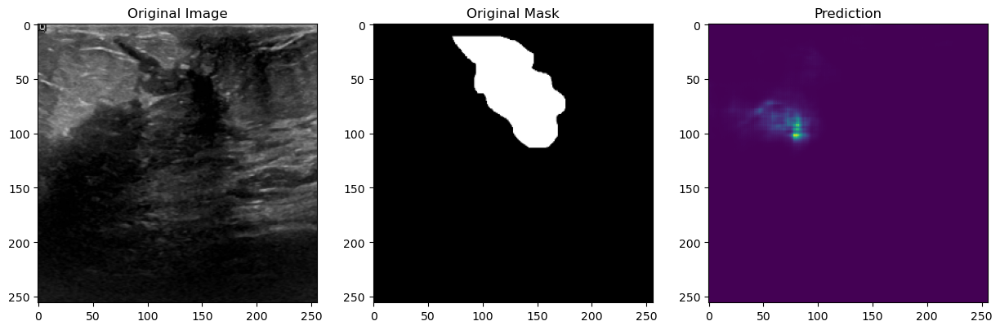

1/1 [==============================] - 0s 28ms/step


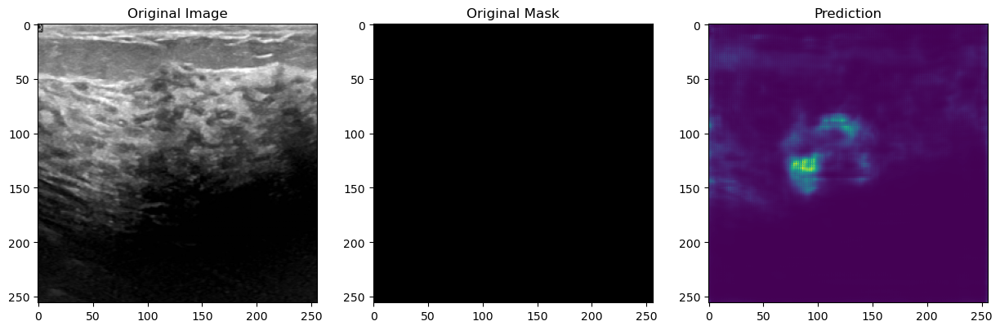

1/1 [==============================] - 0s 27ms/step


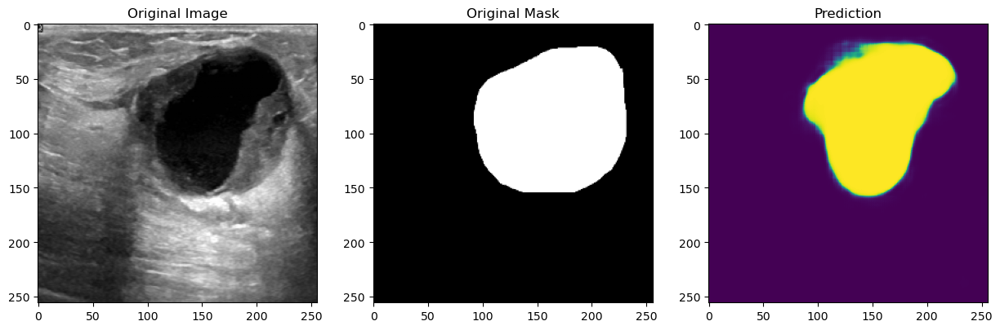

1/1 [==============================] - 0s 28ms/step


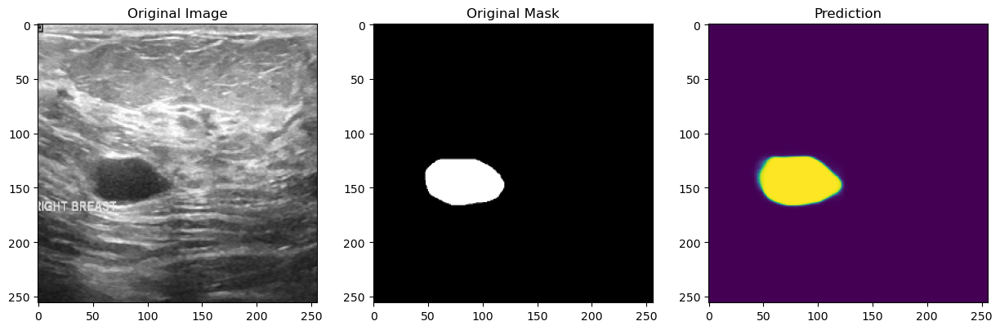

1/1 [==============================] - 0s 29ms/step


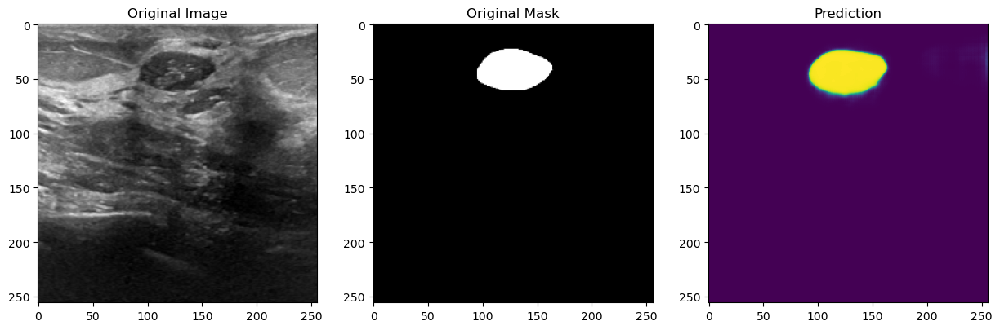

1/1 [==============================] - 0s 29ms/step


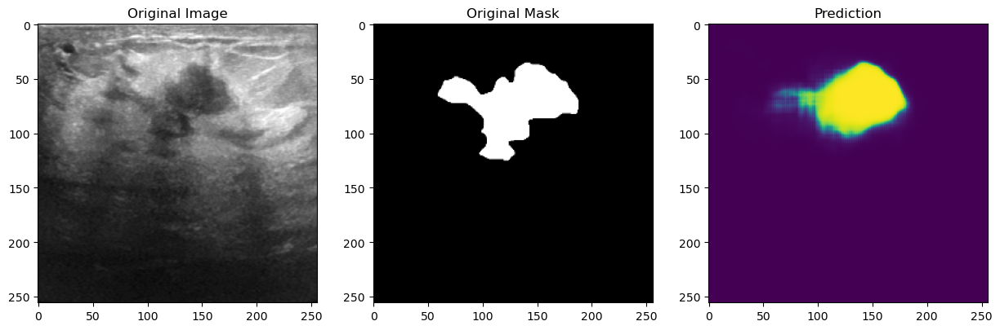

1/1 [==============================] - 0s 25ms/step


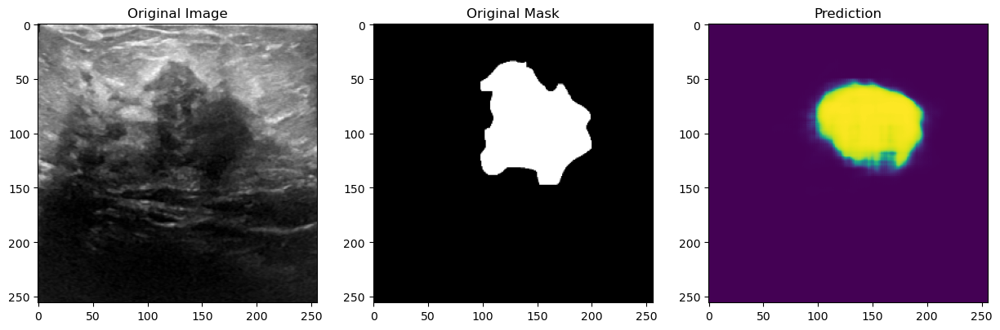

1/1 [==============================] - 0s 27ms/step


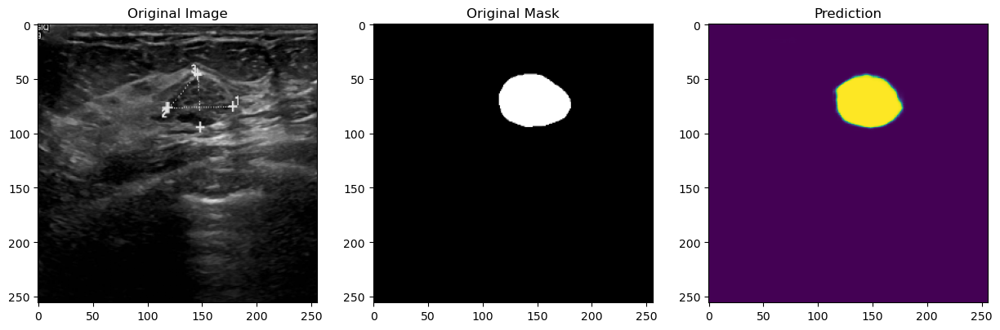

1/1 [==============================] - 0s 25ms/step


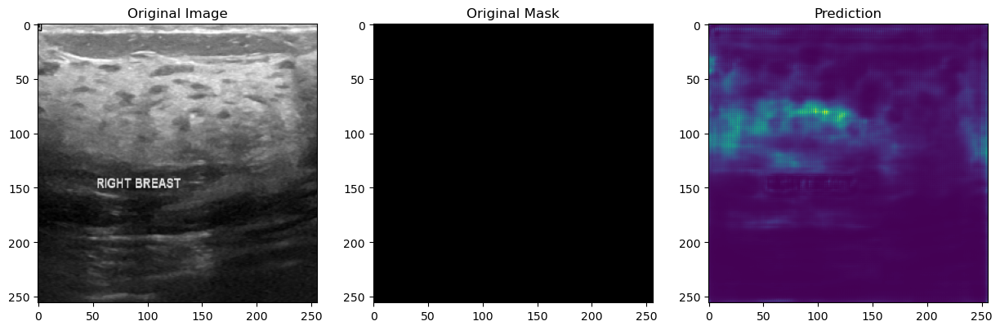

1/1 [==============================] - 0s 24ms/step


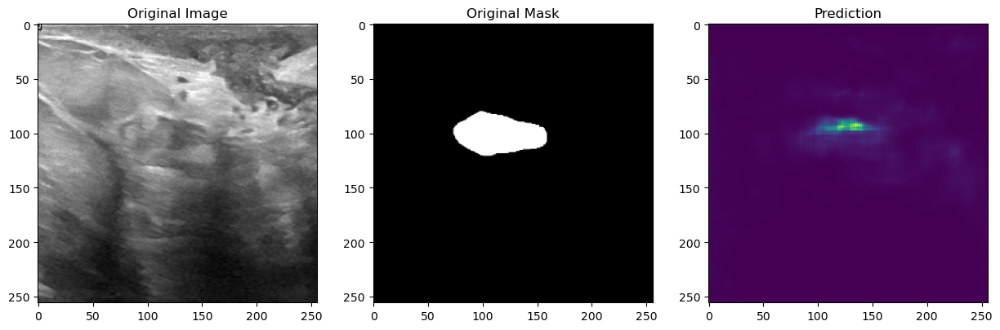

1/1 [==============================] - 0s 27ms/step


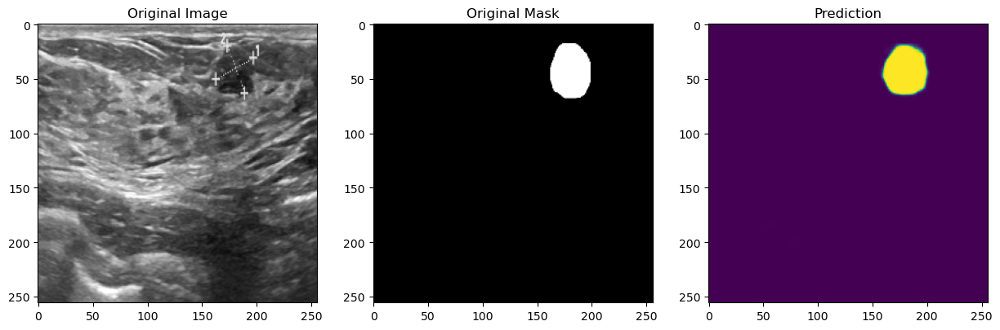

1/1 [==============================] - 0s 23ms/step


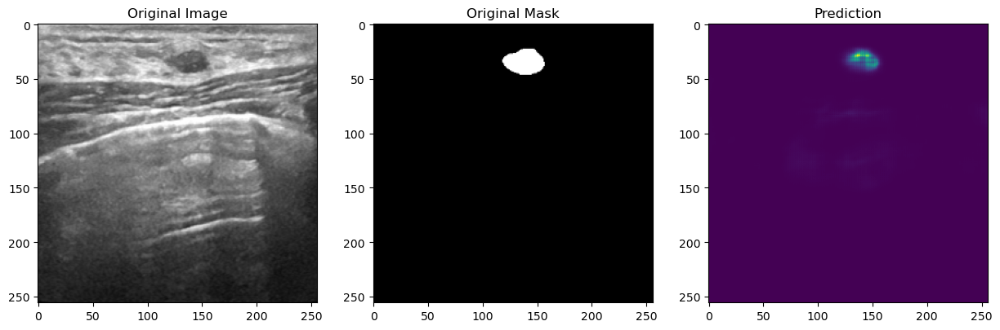

1/1 [==============================] - 0s 26ms/step


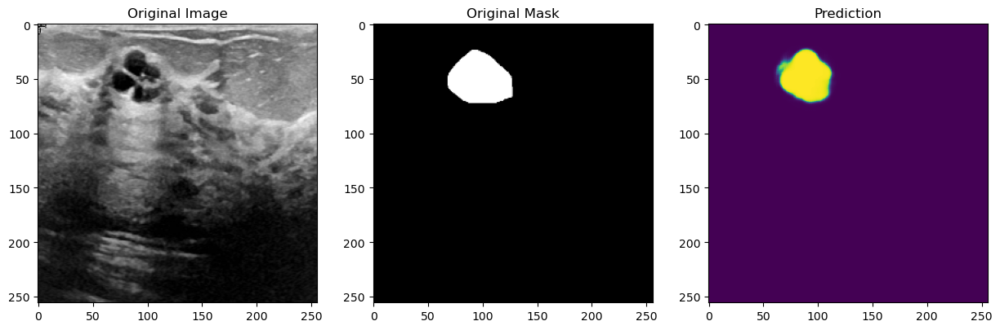

1/1 [==============================] - 0s 25ms/step


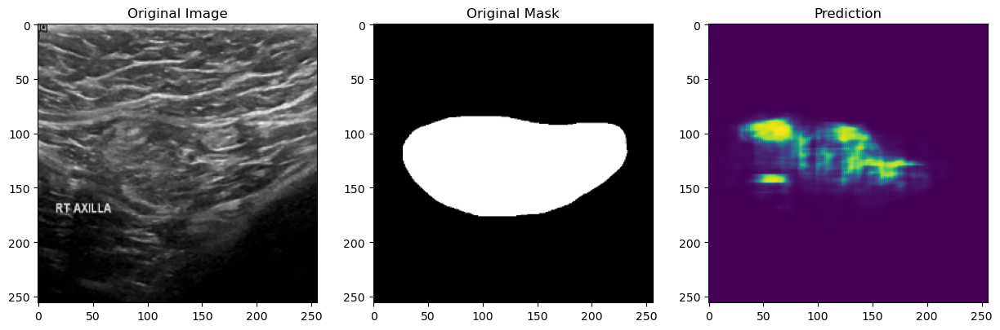

1/1 [==============================] - 0s 25ms/step


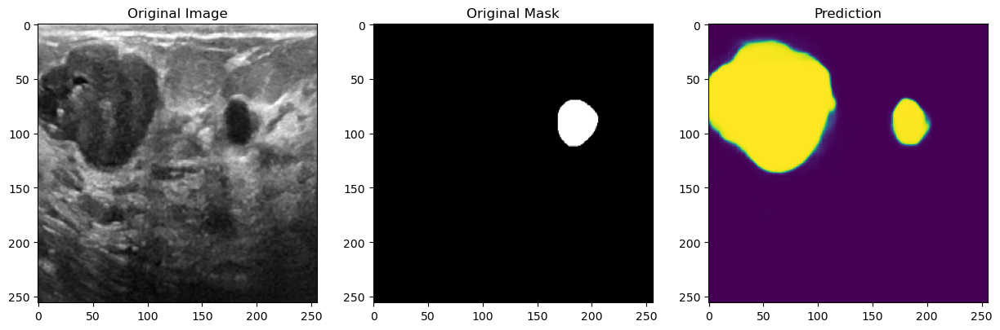

1/1 [==============================] - 0s 27ms/step


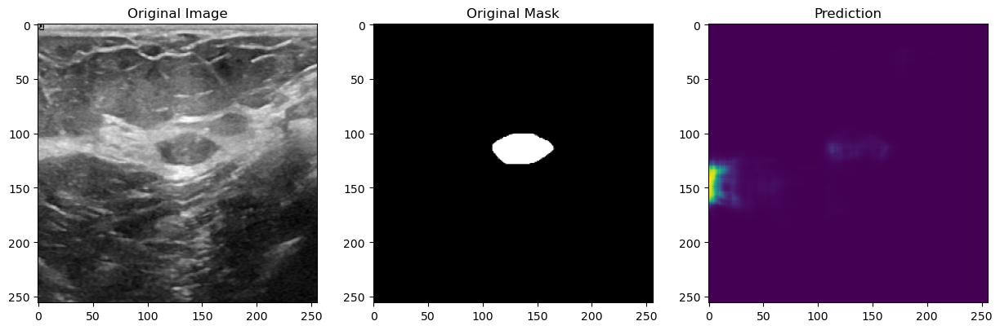

1/1 [==============================] - 0s 27ms/step


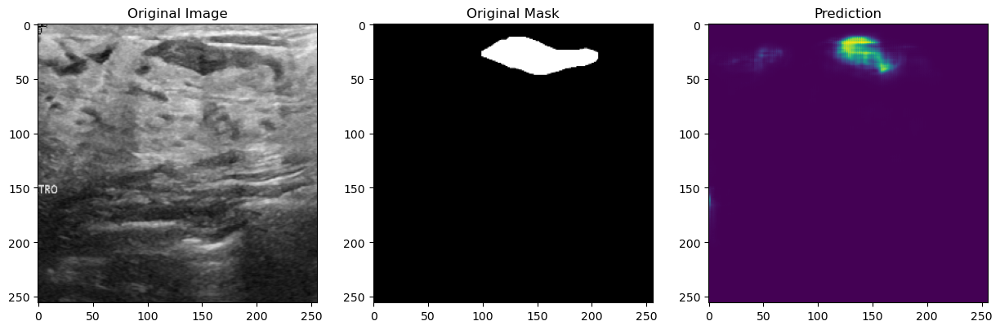

1/1 [==============================] - 0s 30ms/step


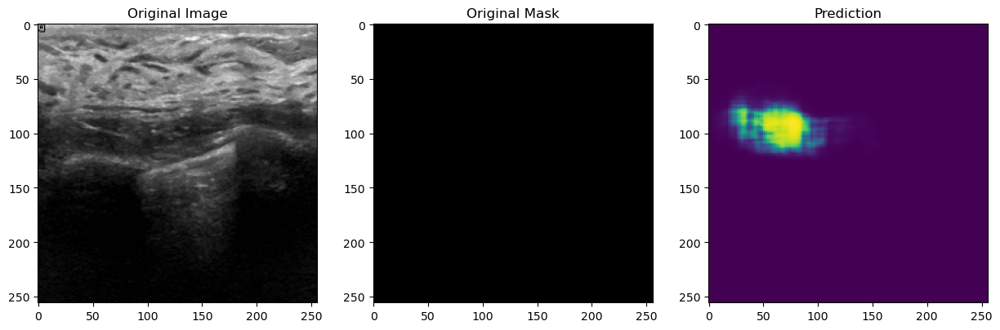

1/1 [==============================] - 0s 29ms/step


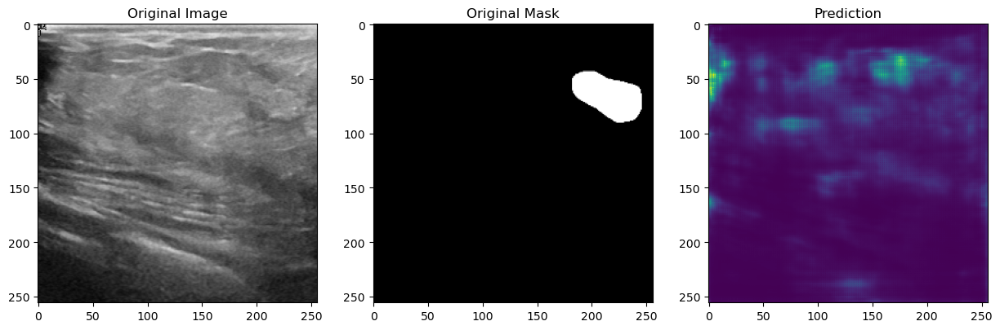

1/1 [==============================] - 0s 27ms/step


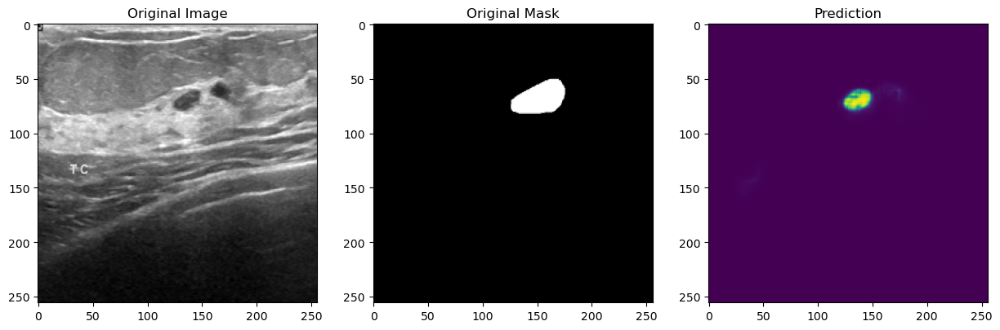

1/1 [==============================] - 0s 28ms/step


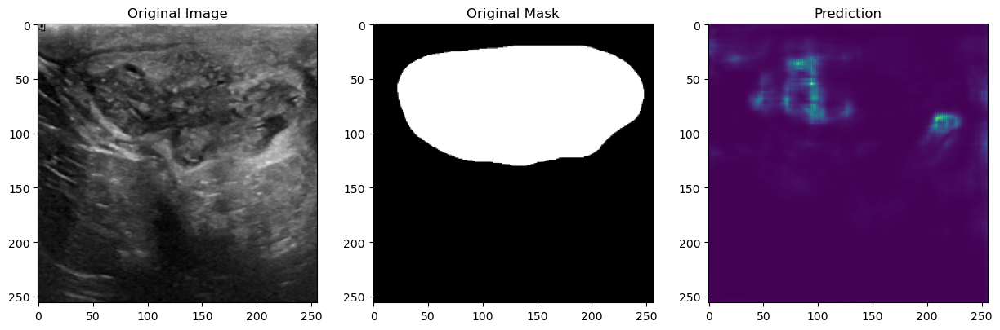

1/1 [==============================] - 0s 40ms/step


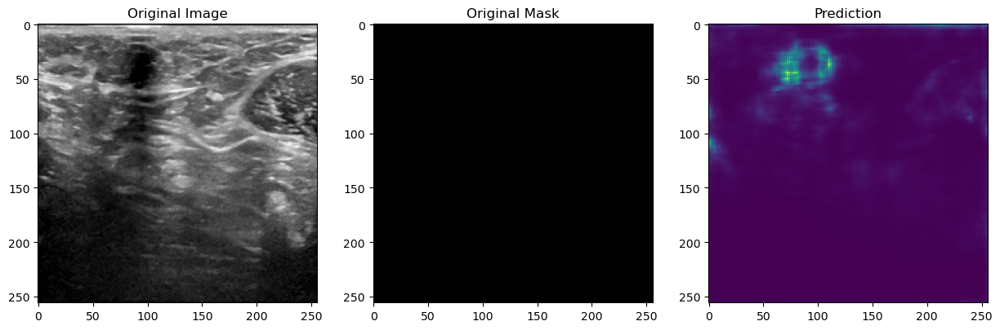

1/1 [==============================] - 0s 25ms/step


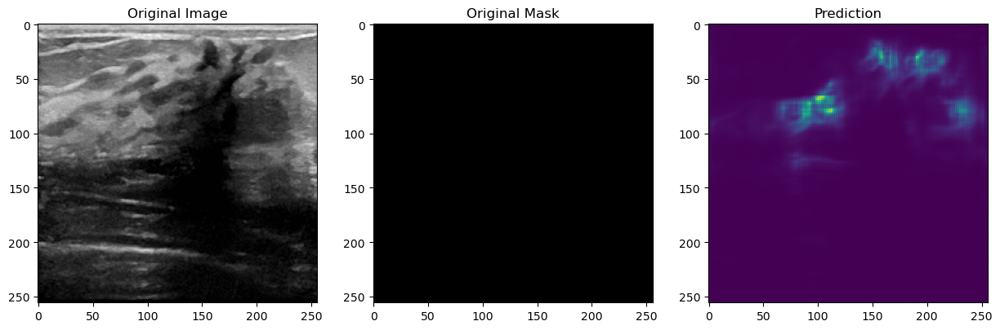

1/1 [==============================] - 0s 25ms/step


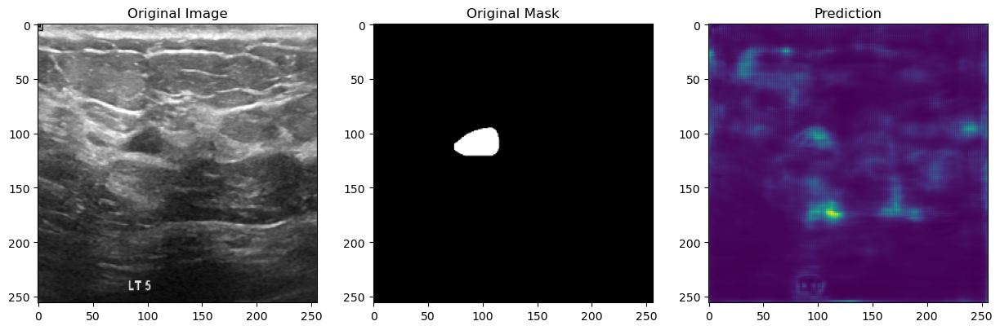

1/1 [==============================] - 0s 28ms/step


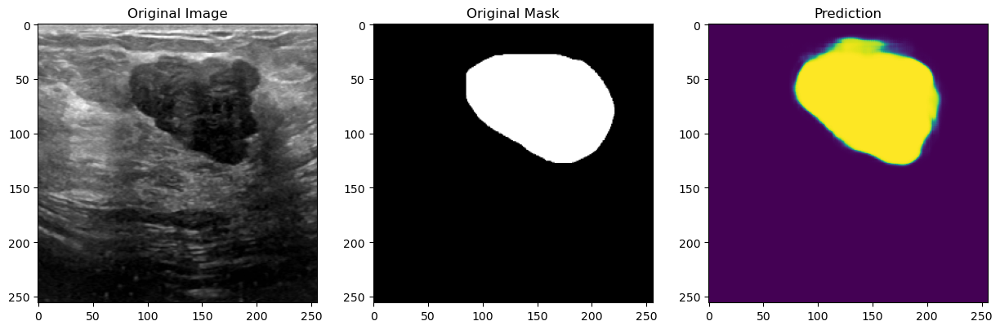

1/1 [==============================] - 0s 26ms/step


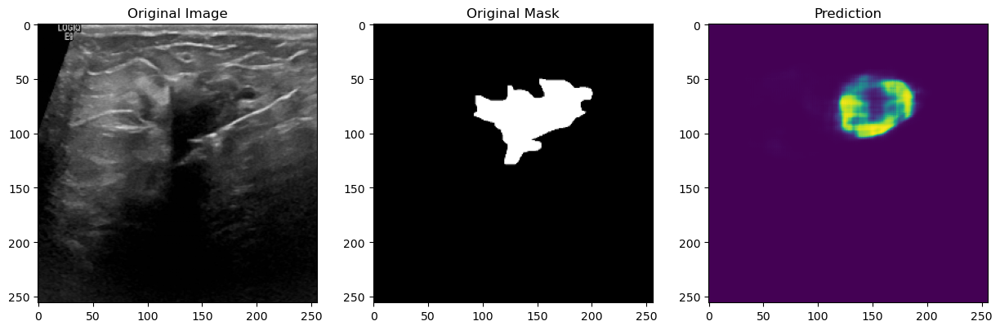

1/1 [==============================] - 0s 27ms/step


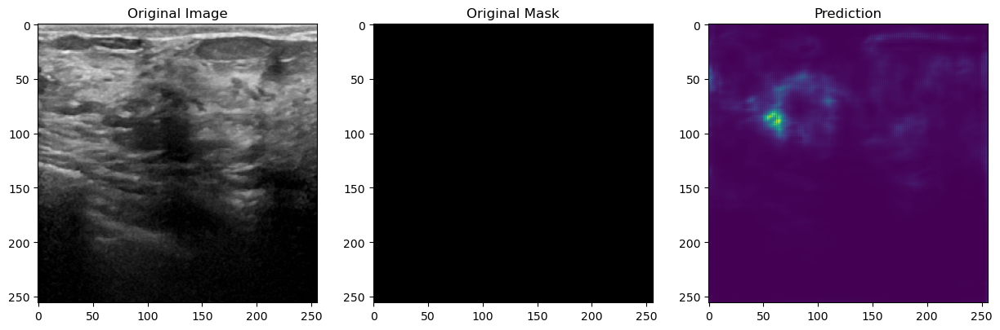

1/1 [==============================] - 0s 25ms/step


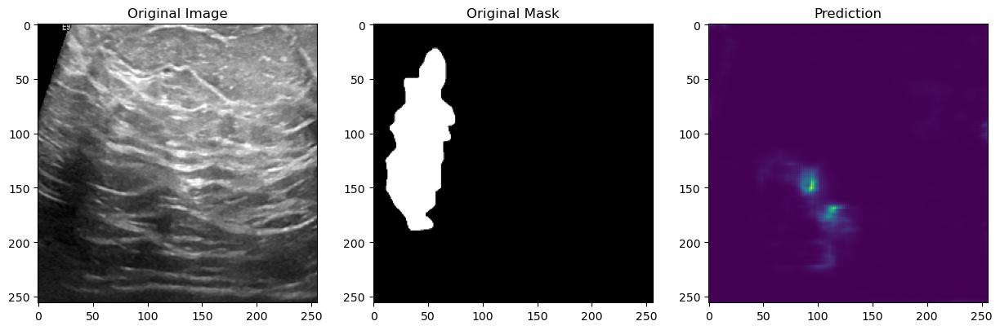

1/1 [==============================] - 0s 28ms/step


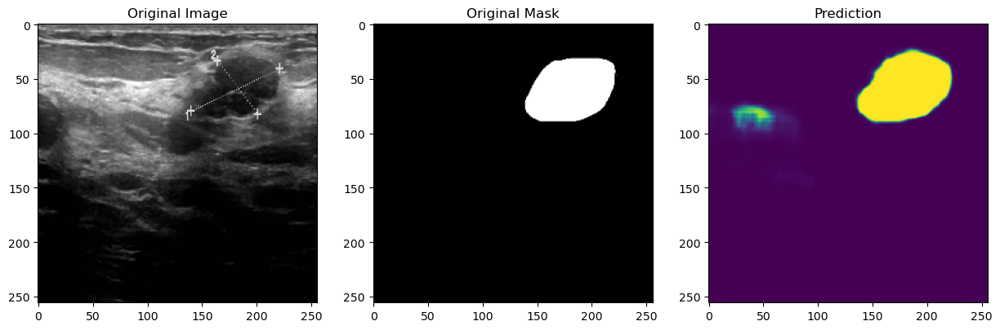

1/1 [==============================] - 0s 29ms/step


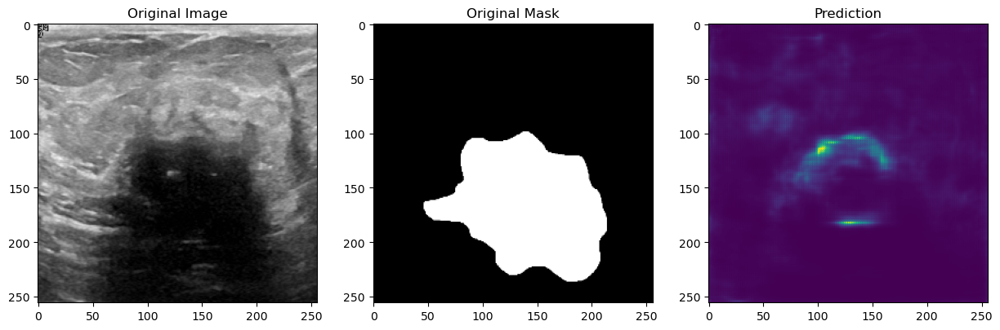

1/1 [==============================] - 0s 25ms/step


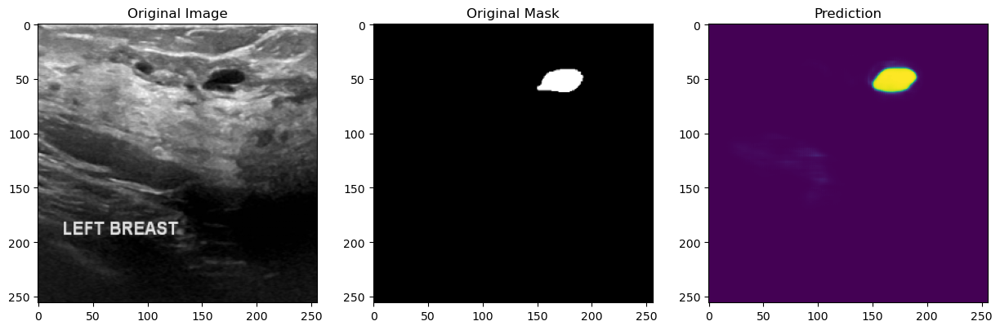

1/1 [==============================] - 0s 27ms/step


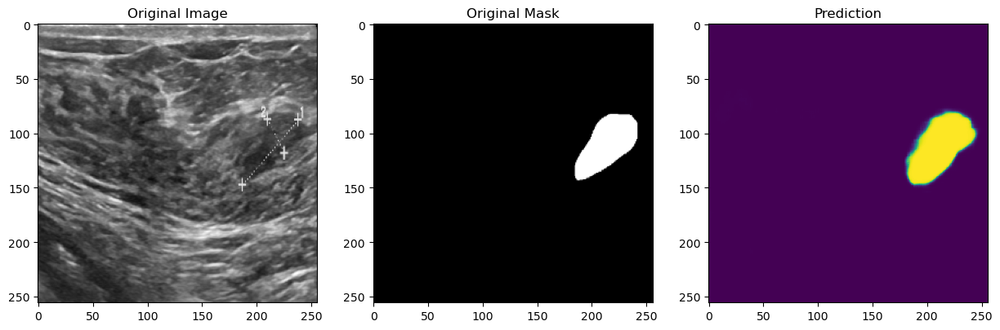

1/1 [==============================] - 0s 27ms/step


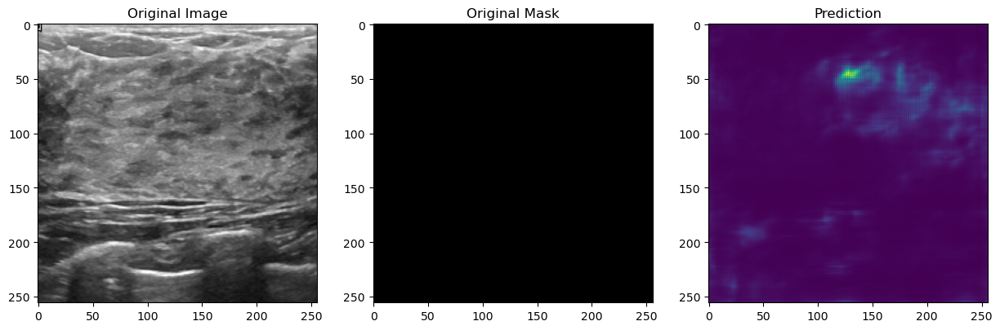

1/1 [==============================] - 0s 29ms/step


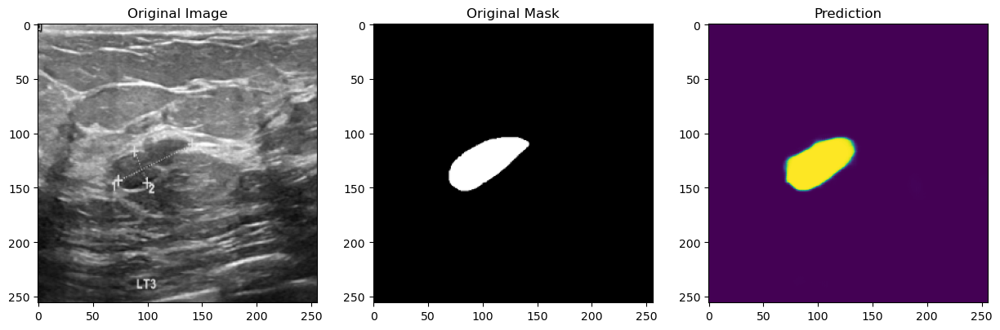

1/1 [==============================] - 0s 30ms/step


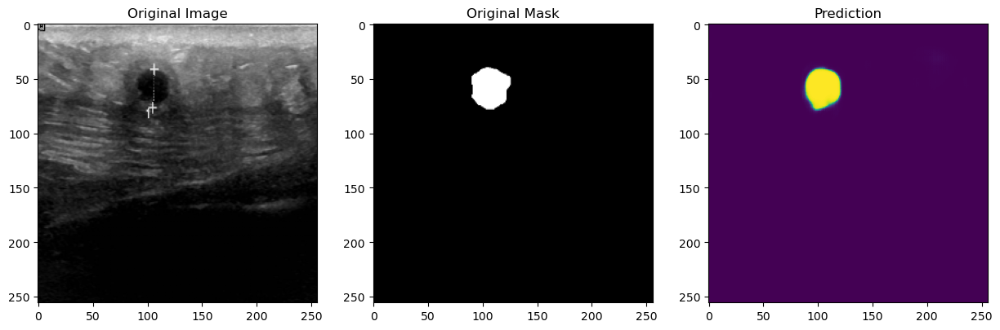

In [89]:
for i in range(60):
    
    img = cv2.imread(df_test['image'].iloc[i])
    mask=cv2.imread(df_test['mask'].iloc[i])
    mask = cv2.resize(mask ,(256, 256))
    img = cv2.resize(img ,(256, 256))
    img = img / 255
    img = img[np.newaxis, :, :, :]
    pred=model.predict(img)
    
    fig, axs = plt.subplots(1, 3, figsize=(15, 5))
    axs[0].imshow(np.squeeze(img))
    axs[0].set_title('Original Image')
    axs[1].imshow(np.squeeze(mask))
    axs[1].set_title('Original Mask')
    axs[2].imshow(np.squeeze(pred[0]))
    axs[2].set_title('Prediction')
    plt.show()
